# Imports & Configuration

## Initial Installations

In [0]:
%pip install h3

  Obtaining dependency information for h3 from https://files.pythonhosted.org/packages/21/22/2692520c17cf888d3c682e3ee0e45c00666e5f6eea9bb5674d1a4a50eb52/h3-4.4.2-cp311-cp311-manylinux2014_x86_64.manylinux_2_17_x86_64.manylinux_2_28_x86_64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/1.0 MB ? eta -:--:--
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 1.0/1.0 MB 38.5 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 25.8 MB/s eta 0:00:00
Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
%restart_python

## Settings

In [0]:
# Imports
import h3
import numpy as np
import pandas as pd
from functools import reduce
from pyspark.sql import DataFrame
from pyspark.sql.functions import pandas_udf, col, lit, explode, count, sum as spark_sum, row_number, first, inline, desc, isnan
from pyspark.sql.types import StructType, StructField, DoubleType, StringType, MapType, IntegerType
from pyspark.sql.window import Window
from pyspark import StorageLevel
from delta.tables import DeltaTable
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors


# Project Constants
POI_SOURCE_TABLE = "Itav_World_POIs"
AIRBNB_SOURCE_TABLE = "airbnb_data_cleaned_raquel"
BOOKING_SOURCE_TABLE = "booking_data_cleaned_raquel"
WORLD_DATA_OUTPUT_TABLE = "Itav_hex_world_data"
POIS_DATA_OUTPUT_TABLE = "Itav_POIS_hex_data"
AIRBNB_DATA_OUTPUT_TABLE = "Itav_airbnb_hex_data"
BOOKING_DATA_OUTPUT_TABLE = "Itav_booking_hex_data"

CATEGORIES_CONFIG = {
    "nightlife": {"k_ring": 8},
    "nature":    {"k_ring": 20},
    "relaxation":{"k_ring": 5},
    "shopping":  {"k_ring": 7},
    "tourist":   {"k_ring": 14}
}
RESOLUTION = 10

print(f"Configuration loaded.")
print(f"Output Resolution: {RESOLUTION}")
print(f"Categories configured: {list(CATEGORIES_CONFIG.keys())}")

Configuration loaded.
Output Resolution: 10
Categories configured: ['nightlife', 'nature', 'relaxation', 'shopping', 'tourist']


## Configuration Inference

In [0]:
# Infere all categories
ALL_CATEGORIES = list(CATEGORIES_CONFIG.keys())

# Algorithm Preparation

## Data Loading

In [0]:
# Load data
print(f"Loading data from {POI_SOURCE_TABLE}...")
df_all_pois = spark.table(POI_SOURCE_TABLE)
print(f"Data loaded. Total rows: {df_all_pois.count()}")

Loading data from Itav_World_POIs...
Data loaded. Total rows: 1502390


## Helper UDFs for H3

### Coordinates to H3 Index UDF

In [0]:
# Define vectorized UDF to compute H3 hexagon index based on Latitude/Longitude
@pandas_udf(StringType())
def convert_to_h3(lat_series: pd.Series, lon_series: pd.Series, res_series: pd.Series) -> pd.Series:
    """
    Converts Latitude/Longitude to H3 Index.
    Returns a Series of H3 index strings.
    """
    res = int(res_series.iloc[0])
    
    return pd.Series([
        h3.latlng_to_cell(lat, lon, res) 
        for lat, lon in zip(lat_series, lon_series)
    ])

### H3 Index to Coordinates UDF

In [0]:
# Schema for Coordinate Output
coords_schema = StructType([
    StructField("latitude", DoubleType(), True),
    StructField("longitude", DoubleType(), True)
])

# UDF to convert H3 Index back to Lat/Lon
@pandas_udf(coords_schema)
def get_h3_centroid(h3_series: pd.Series) -> pd.DataFrame:
    """
    Converts H3 Index to Centroid Coordinates.
    Returns a DataFrame with columns ['latitude', 'longitude'] matching the output schema.
    """
    coords_list = h3_series.apply(h3.cell_to_latlng).tolist()
    return pd.DataFrame(coords_list, columns=['latitude', 'longitude'])

### Spatial Influence UDF

In [0]:
# Define UDF for Neighbor Discovery
@pandas_udf(MapType(StringType(), IntegerType()))
def get_spatial_distance_map(h3_series: pd.Series, k_ring_series: pd.Series) -> pd.Series:
    """
    For each H3 hexagon index in the input Series, returns a map of neighboring hexagon indices
    (including itself) to their distance (in hexagons) from the source cell, up to SMOOTHING_DISTANCE.
    Returns a map of {neighbor_h3: distance} for each cell.
    """
    results = []
    
    # Extract constants from the first row of the batch
    k_ring = int(k_ring_series.iloc[0])
    
    for center_h3 in h3_series:
        neighbor_map = {}

        previous_disk = set()
        for dist in range(k_ring + 1):
            
            # Get all cells with distance k
            current_disk = set(h3.grid_disk(center_h3, dist))
            current_ring = current_disk - previous_disk
            previous_disk = current_disk

            for hex_id in current_ring:
                neighbor_map[hex_id] = dist
        
        results.append(neighbor_map)
    
    return pd.Series(results)

# Algorithm

## Spatial Score Calculation

This block executes the core spatial scoring algorithm.  
For each category, it maps POIs to H3 indices and calculates a raw count.  
It then applies spatial smoothing by distributing the score to neighboring cells using a linear decay function:
$$
\text{Score} = \text{Count} \times \frac{K - d}{K}
$$
where K is the ring size and d is the distance.  
Finally, it unions all categories and pivots the data to create a feature vector for each hexagon, resulting in a distinct score column for every category.

In [0]:
dfs_to_union = []

for category, config in CATEGORIES_CONFIG.items():
    # Extract config
    k_ring = config['k_ring']
        
    # Filter data
    category_df = df_all_pois.filter(
        col("category") == category). \
        select("latitude", "longitude")
    
    # Convert to H3 index
    indexed_df = category_df.withColumn("h3_id", convert_to_h3(col("latitude"), col("longitude"), lit(RESOLUTION)))

    # Reduce to hexagons (Raw Count)
    hex_count_df = indexed_df.groupBy("h3_id").agg(
        count("*").alias("poi_count")
    )

    # Extract neighbors
    neighbors_df = hex_count_df.withColumn("neighbor_map", get_spatial_distance_map(col("h3_id"), lit(k_ring)))
    
    # Influence each neighbor (Decay Function)
    Influence_df = neighbors_df.select(
        col("poi_count"),
        explode(col("neighbor_map")).alias("h3_neighbor", "distance")
    ).withColumn(
        "score", 
        col("poi_count") * (lit(k_ring) - col("distance")) / lit(k_ring if k_ring > 0 else 1)
    ).withColumnRenamed("h3_neighbor", "h3_index")
    
    # Aggregate influences
    aggregated_df = Influence_df.groupBy("h3_index").agg(
        spark_sum("score").alias("score")) \
        .withColumn("category_name", lit(category))

    aggregated_df.persist(StorageLevel.DISK_ONLY)
    row_count = aggregated_df.count()
    print(f"Finished processing {category}: {row_count} rows stored.")
    dfs_to_union.append(aggregated_df)

# Union All
united_df = reduce(lambda df1, df2: df1.union(df2), dfs_to_union)

# Pivot Scores
scored_features_df = united_df.groupBy("h3_index") \
    .pivot("category_name", ALL_CATEGORIES) \
    .sum("score") \
    .na.fill(0)

# Rename columns to *_score
for cat in ALL_CATEGORIES:
    if cat in scored_features_df.columns:
        scored_features_df = scored_features_df.withColumnRenamed(cat, f"{cat}_score")

scored_features_df.persist(StorageLevel.DISK_ONLY)
final_count = scored_features_df.count()
print(f"\nDone. Rows calculated: {final_count}\n")
display(scored_features_df.limit(5))

for df in dfs_to_union:
    df.unpersist()

Finished processing nightlife: 35730547 rows stored.
Finished processing nature: 20603539 rows stored.
Finished processing relaxation: 25482885 rows stored.
Finished processing shopping: 6779848 rows stored.
Finished processing tourist: 28413161 rows stored.

Done. Rows calculated: 83624448



h3_index,nightlife_score,nature_score,relaxation_score,shopping_score,tourist_score
8a2f5aadec5ffff,634.125,0.0,39.6,10.285714285714285,11.428571428571429
8a2654226c27fff,0.5,0.0,0.0,0.0,0.0
8a1f98b59917fff,1.0,0.0,0.0,0.0,0.0
8a802bc00407fff,1.0,0.0,1.4,0.0,0.0
8a2986b13b1ffff,3.25,0.0,0.0,0.0,0.6428571428571428


## H3 Metadata Generation

This block resolves geographic ambiguities by assigning each hexagon to a single City and Country based on a majority vote of the POIs contained within it.  
By grouping all POIs by their H3 index and location attributes, we count the occurrences and select the most frequent label.  
This ensures that a hexagon is classified correctly even if it contains a small number of outliers or erroneous data points.

In [0]:
# Convert to H3 index
indexed_df = df_all_pois.withColumn("h3_index", convert_to_h3(col("latitude"), col("longitude"), lit(RESOLUTION)))

# Vote for metadata
votes_df = indexed_df.groupBy("h3_index", "city", "country_code").agg(count("*").alias("votes"))

# Determine winner
window_spec = Window.partitionBy("h3_index").orderBy(col("votes").desc())
h3_metadata_df = votes_df.withColumn("rank", row_number().over(window_spec)) \
    .filter(col("rank") == 1) \
    .select("h3_index", "city", "country_code") \
    .dropDuplicates(["h3_index"])

print("Metadata generation complete.\n")
display(h3_metadata_df.limit(5))

Metadata generation complete.



h3_index,city,country_code
8a0122a0806ffff,Honningsvåg,NO
8a0124304537fff,Alta,NO
8a012592a677fff,Skjervøy,NO
8a0135562777fff,Troms og Finnmark,NO
8a0743a63927fff,Suðurland,IS


## Merge & Save

This block consolidates the analysis.  
It joins the scores with the metadata.  
Crucially, it calculates the Centroid Coordinates for all hexagons (including those that received scores via spatial smoothing but contain no POIs) effectively filling in the missing geographic data for "halo" cells.

In [0]:
# Join Scores with Metadata
joined_df = scored_features_df.join(
    h3_metadata_df,
    on="h3_index",
    how="left"
)

# Add Centroids
final_hex_data_df = joined_df.withColumn("coords", get_h3_centroid("h3_index")) \
    .select("*", "coords.*").drop("coords")

# Reorder Columns
score_columns = [c for c in scored_features_df.columns if c != "h3_index"]
metadata_columns = [c for c in h3_metadata_df.columns if c != "h3_index"]
final_cols = ["h3_index", "latitude", "longitude"] + metadata_columns + score_columns
final_ordered_df = final_hex_data_df.select(*final_cols)

# Save
final_ordered_df.write \
    .format("delta") \
    .mode("overwrite") \
    .option("overwriteSchema", "true") \
    .saveAsTable(WORLD_DATA_OUTPUT_TABLE)

# Z-order over coordinates
delta_table = DeltaTable.forName(spark, WORLD_DATA_OUTPUT_TABLE)
delta_table.optimize().executeZOrderBy(["latitude", "longitude"])

print("World data saved successfully.\n")
display(final_ordered_df.limit(5))

World data saved successfully.



h3_index,latitude,longitude,city,country_code,nightlife_score,nature_score,relaxation_score,shopping_score,tourist_score
8a1f98b59917fff,45.79855745532186,8.610213274051299,Ispra,IT,1.0,0.0,0.0,0.0,0.0
8a2654226c27fff,39.229850628323916,-92.8419162214548,null,null,0.5,0.0,0.0,0.0,0.0
8a2986b13b1ffff,36.06343754248515,-115.28369377852012,Las Vegas,US,3.25,0.0,0.0,0.0,0.6428571428571428
8a2f5aadec5ffff,35.668818881767194,139.76394923096188,中央区,JP,634.125,0.0,39.6,10.285714285714285,11.428571428571429
8a802bc00407fff,-4.2170892608514565,-44.791077612613144,Bacabal,BR,1.0,0.0,1.4,0.0,0.0


### Clean Up Memory

In [0]:
# Unpersist non-required DataFrame
scored_features_df.unpersist()

DataFrame[h3_index: string, nightlife_score: double, nature_score: double, relaxation_score: double, shopping_score: double, tourist_score: double]

## Final Data Consolidation

### Accommodation Datasets Construction

These blocks creates the enriched accommodation datasets by mapping accommodation places (Airbnb and booking) to their environmental context.
It filters out invalid coordinates, calculates the H3 index for each accommodation place, and joins the data with the computed World Scores.  
This assigns each accommodation places a feature vector representing its surrounding environment (nightlife intensity, nature proximity), creating a dataset ready for downstream analysis.

#### Airbnb Dataset Construction

In [0]:
# Read Tables
world_scores_df = spark.table(WORLD_DATA_OUTPUT_TABLE)
airbnb_df = spark.table(AIRBNB_SOURCE_TABLE)

# Filter Invalid Coordinates
airbnb_clean_df = airbnb_df.filter(
    col("lat").isNotNull() & 
    col("long").isNotNull() & 
    (col("lat") >= -90) & (col("lat") <= 90) & 
    (col("long") >= -180) & (col("long") <= 180) &
    (~isnan(col("lat"))) & (~isnan(col("long")))
)

# Calculate H3 Index
indexed_airbnb_df = airbnb_clean_df.withColumn(
    "h3_index", 
    convert_to_h3(col("lat"), col("long"), lit(RESOLUTION))
)

# Find score
joined_columns = [f"{cat}_score" for cat in ALL_CATEGORIES] + ["h3_index"]
enriched_airbnb_df = indexed_airbnb_df.join(
    world_scores_df.select(*joined_columns),
    on="h3_index",
    how="left"
).fillna(0)

# Save
enriched_airbnb_df.write \
    .format("delta") \
    .mode("overwrite") \
    .clusterBy("h3_index") \
    .option("overwriteSchema", "true") \
    .saveAsTable(AIRBNB_DATA_OUTPUT_TABLE)

print(f"Saved to: {AIRBNB_DATA_OUTPUT_TABLE}")
display(enriched_airbnb_df.limit(5))

Saved to: Itav_airbnb_hex_data


h3_index name image description category availability discount reviews seller_info breadcrumbs location pets_allowed description_items category_rating house_rules details highlights arrangement_details amenities images available_dates url final_url listing_title property_id listing_name location_details description_by_sections description_html location_details_html is_supperhost host_rating hosts_year host_response_rate is_guest_favorite travel_details pricing_details currency cancellation_policy country postcode_map_url host_image host_details price total_price host_number_of_reviews property_number_of_reviews guests ratings lat long flag_no_reviews flag_suspicious_text flag_bad_price safety_alert nightlife_score nature_score relaxation_score shopping_score tourist_score 8a07443632dffff Bed and breakfast in Sveitarfélagið Hornafjörður · ★4.94 · 1 bedroom · 1 bed · 2.5 shared baths https://a0.muscache.com/pictures/miso/Hosting-1000548821664390249/original/0b9bc860-c278-4d4d-a819-c5744d748520.jpeg Set on a traditional Icelandic farm, Setberg Guesthouse is located outside of Höfn, a 14-minute drive from the seaside village centre. Located at the foot of mountains, you can enjoy the impressive view from the room or go hiking for a closer look.The spaceEach heated room features wooden floors and has access to the shared kitchen. Bathroom facilities are also shared, 4 rooms share 2.5 bathroom.Guest accessFeel welcome to use the shared kitchen.During your stayAt Setberg Guesthouse, you may be greeted, and perhaps even entertained, by the friendly resident dog. Stays false null ["Stefán’s place was exactly what we needed for one night stay. We were running behind on our driving schedule and they graciously accommodated a late check-in. The place is a guest house so there are multiple other rooms, maybe about 5? But each room has their own lock and key. The place is pristine and super clean. All the reviews that mention the showers being spotless and water pressure being great are all true. The location is beautiful, you’re off the main road but it’s a bit of a long drive in so it’s very peaceful and quiet. Highly recommend!","This was my favourite stay throughout our whole trip in Iceland! This guesthouse was super cozy, clean and modern. I think I took one of my best showers here. Stefan and his wife were very friendly. She gave me a tour of the place and tried her best despite the limited English! The kitchen was very well equipped. The view surrounding this place was amazing (when it’s not super misty or cloudy!) There are two lovely dogs here and we really bonded with one of them. We met lovely guests and had great chats. Overall, this stay was very memorable and made the trip even better!","Amazing and cosy accommodation. Building is on the quiet but accessible spot on Ring road. Beds are comfy and fresh, kitchen and bathroom look like on the pictures, everything is nice and clean. Stefan is very nice and helping, later checkin was not a problem for him. Strongly recommended! It was the best stay we had on Ring road so far, thank you!","Tranquile and beautiful location and surroundings. The guest house was surpringsly nice and everything inside was of high quality and clean. The surroundings are just mesmerizing! Stefan greeted us late and night as we were late, but still very friendly and pre-communication was timely and helpfull. Highly recommend this place!","Awesome guesthouse not far from Hofn. Incredibly peaceful and quiet. Each room is beautifully kept. Bathrooms seem new and very stylishly appointed. Everything you need in the kitchen. It was a perfect one night stopover for us. We were lucky to meet Stefan's dog who is just a delight. Stefan is a friendly welcoming host.","Stefan‘s farm AirBB is located in a beautiful valley near Höfn. The place is very well appointed in case you want to cook. It is cozy and clean and we felt right at home. Stefan is a super nice guy who grew up on his farm and is a former sheep farmer.

#### Booking Dataset Construction

In [0]:
# Read Tables
world_scores_df = spark.table(WORLD_DATA_OUTPUT_TABLE)
booking_df = spark.table(BOOKING_SOURCE_TABLE)

# Filter Invalid Coordinates
booking_coordinates_df = booking_df.withColumn("lat", col("coordinates.lan")).withColumn("long", col("coordinates.lon"))
booking_clean_df = booking_coordinates_df.filter(
    col("lat").isNotNull() & 
    col("long").isNotNull() & 
    (col("lat") >= -90) & (col("lat") <= 90) & 
    (col("long") >= -180) & (col("long") <= 180) &
    (~isnan(col("lat"))) & (~isnan(col("long")))
)

# Calculate H3 Index
indexed_booking_df = booking_clean_df.withColumn(
    "h3_index", 
    convert_to_h3(col("lat"), col("long"), lit(RESOLUTION))
)

# Find score
joined_columns = [f"{cat}_score" for cat in ALL_CATEGORIES] + ["h3_index"]
enriched_booking_df = indexed_booking_df.join(
    world_scores_df.select(*joined_columns),
    on="h3_index",
    how="left"
).fillna(0)

# Save
spark.conf.set("spark.databricks.delta.properties.defaults.columnMapping.mode", "name")
spark.conf.set("spark.databricks.delta.schema.autoMerge.enabled", "true")
enriched_booking_df.write \
    .format("delta") \
    .mode("overwrite") \
    .clusterBy("h3_index") \
    .option("overwriteSchema", "true") \
    .saveAsTable(BOOKING_DATA_OUTPUT_TABLE)

print(f"Saved to: {BOOKING_DATA_OUTPUT_TABLE}")
display(enriched_booking_df.limit(5))

Saved to: Itav_booking_hex_data


h3_index availability city coordinates country description fine_print hotel_id house_rules images location managed_by manager_language_spoken manager_score metro_railway_access most_popular_facilities number_of_reviews popular_facilities property_highlights property_information property_surroundings review_score reviews_scores title top_reviews url rating_norm flag_no_reviews flag_suspicious_text safety_alert lat long nightlife_score nature_score relaxation_score shopping_score tourist_score 8a098828850ffff List(List(7 twin beds, 3 full beds, 1 queen bed, null, 12, Apartment)) Beitostøl List(61.2496034, 8.9026053) Norway 15 miles from Høre Stave Church in Beitostøl, Apartment City Beitostølen offers accommodations with access to a sauna. This property offers access to a terrace and free private parking. Guests can use a garden.

With free Wifi, this 5-bedroom apartment features a TV, a washing machine, and a fully equipped kitchen with a dishwasher and oven. Guests can take in the views of the mountain from the balcony, which also has outdoor furniture. There's also a seating area and a fireplace.

Skiing, cycling, and hiking are possible within the area, and the apartment offers ski storage space. This property does not accommodate bachelor(ette) or similar parties. 9524053 List(List(From 3:00 PM You need to let the property know what time you'll be arriving in advance., Check-in), List(Until 1:00 PM, Check-out), List(Cancellation and prepayment policies vary according to accommodation type. Enter your stay dates and check the conditions of your selected option., Cancellation/ prepayment), List(Child policies Children of all ages are welcome. To see correct prices and occupancy info, add the number and ages of children in your group to your search. Crib and extra bed policies Cribs and extra beds aren't available at this property., Children & Beds), List(There's no age requirement for check-in, No age restriction), List(Booking.com takes your payment for this stay on behalf of the property, but make sure you have cash for any extras once you get there., Payments by Booking.com), List(Smoking is not allowed., Smoking), List(Parties/events are not allowed, Parties), List(Free! Pets are allowed. No extra charges., Pets)) List(https://cf.bstatic.com/xdata/images/hotel/max200/423055747.jpg?k=0d2422ee1b3a48cfd52363f01fcf91e2e868f307411911b09f2696ec07efffc2&o=, https://cf.bstatic.com/xdata/images/hotel/max200/423056513.jpg?k=eb70ef4760e052854a0507ae1ede5038e48f3da8edfe953196c3809e84939203&o=, https://cf.bstatic.com/xdata/images/hotel/max200/423057024.jpg?k=f4500520a2f875da4a451e56e7bef6053f5674783d451b91bd6a5985df156413&o=, https://cf.bstatic.com/xdata/images/hotel/max200/423056804.jpg?k=b22aa3442fbd8ae6078c3c136d8d0fde8ba86d59af422df7db0b351d538c77c1&o=, https://cf.bstatic.com/xdata/images/hotel/max200/423057344.jpg?k=6e15aa1194464f13e13ec5237ad633e13e1d8cdd98995f17fd2bcac2119677b2&o=, https://cf.bstatic.com/xdata/images/hotel/max200/423057230.jpg?k=8aafc9bb797c8bedba6b2c6f85de2be5588b2addb7f3b279ca00b9dea417e577&o=, https://cf.bstatic.com/xdata/images/hotel/max200/423057185.jpg?k=5860a1e37caa591a62473a967821efb96349727d31dba973cc35b64d9e45c004&o=, https://cf.bstatic.com/xdata/images/hotel/max200/423056629.jpg?k=f57d2a94f8aad3fdc034a47aca511d15784edd2b15b6fb640d548297f75125ae&o=, https://cf.bstatic.com/xdata/images/hotel/max200/423056491.jpg?k=9c7a427b4dd4e1cc28e3cc85e42fe1754da99c26c7f6dedeea67d95fc777cd30&o=, https://cf.bstatic.com/xdata/images/hotel/max200/423056536.jpg?k=eff36a1b45e241228a2abe466a966debead67a0cac8d28b4d67b3c758c489f9e&o=, https://cf.bstatic.com/xdata/images/hotel/max200/423056663.jpg?k=5ce4ab9aabac897a7323643a808746f300119f39c151361477ee5beb3a1ee8bb&o=, https://cf.bstatic.com/xdata/images/hotel/max200/423056773.jpg?k=bb4aacbb80fbf9e3e59253552bb34c875f4423448213f9bbb13714d8469b1897&o=, https://cf.bstatic.com/xdata/images/hotel/max200/423056963.jpg?k=5adbc4faf6c3be183518ee4e0a5104281ec21e57c821324120f1a10910e67c2

### POI Dataset Construction

This block creates the enriched POI dataset by mapping POIs to their environmental context.  
It filters out invalid coordinates, calculates the H3 index for each POI, and joins the data with the computed World Scores.  
This assigns each POI a feature vector representing its surrounding environment (nightlife intensity, nature proximity), creating a dataset ready for downstream analysis.

In [0]:
# Read Tables
world_scores_df = spark.table(WORLD_DATA_OUTPUT_TABLE) 
poi_source_df = spark.table(POI_SOURCE_TABLE)

# Filter Invalid Coordinates
poi_clean_df = poi_source_df.filter(
    col("latitude").isNotNull() & 
    col("longitude").isNotNull() & 
    (col("latitude") >= -90) & (col("latitude") <= 90) & 
    (col("longitude") >= -180) & (col("longitude") <= 180) &
    (~isnan(col("latitude"))) & (~isnan(col("longitude")))
)

# Calculate H3 Index
indexed_poi_df = poi_clean_df.withColumn(
    "h3_index", 
    convert_to_h3(col("latitude"), col("longitude"), lit(RESOLUTION))
)

# Find score
joined_columns = [f"{cat}_score" for cat in ALL_CATEGORIES] + ["h3_index"]
pois_enriched_df = indexed_poi_df.join(
    world_scores_df.select(*joined_columns),
    on="h3_index",
    how="left"
).fillna(0)

# Save
pois_enriched_df.write \
    .format("delta") \
    .mode("overwrite") \
    .option("overwriteSchema", "true") \
    .saveAsTable(POIS_DATA_OUTPUT_TABLE)

print(f"Saved to: {POIS_DATA_OUTPUT_TABLE}")
display(pois_enriched_df.limit(5))

Saved to: Itav_POIS_hex_data


h3_index,place_id,name,subcategory,category,latitude,longitude,city,country_code,data_source,nightlife_score,nature_score,relaxation_score,shopping_score,tourist_score
8a1e812111a7fff,0001fb1b-fea3-401d-8e01-3845eaf818d9,Birrofficina,bar,nightlife,41.980934,15.005521,Termoli,IT,meta,3.0,0.0,0.0,1.7142857142857142,0.0
8aa81004e28ffff,00049ca5-c5c4-4ac2-9b22-f09a8711ab65,Casa da Sogra,bar,nightlife,-23.585606,-46.805176,São Paulo,BR,meta,1.25,0.0,3.0,0.0,0.0
8a2748731277fff,00ac4f2f-d465-4ffd-820f-eb848b7d988f,L.M. Wise Preserve,nature_reserve,nature,42.61479,-85.692566,Hopkins,US,meta,0.0,1.0,0.0,0.0,0.0
8a280695b097fff,00322bbc-cc2f-498d-ac83-5fa6762d8066,Mendocino Area Parks Association,nature_reserve,nature,39.305325,-123.79729,Mendocino,US,Microsoft,0.75,1.0,2.2,0.0,1.8571428571428572
8a65b5670707fff,00011649-9c03-47c3-aa3c-9380df84d177,Tapas & Oyster Bar,bar,nightlife,10.816262,106.73399,Thủ Đức,VN,meta,2.125,0.45,0.6,0.0,0.0


## Validation

### Israel's Top Locations

In [0]:
# Load data back
israel_df = spark.table(WORLD_DATA_OUTPUT_TABLE).filter(col("country_code") == "IL").cache()

for category in ALL_CATEGORIES:
    score_col = f"{category}_score"
    print(f"\nTop 5 Places in Israel for: {category.upper()}")
    
    display(israel_df
     .orderBy(col(score_col).desc())
     .select("city", score_col, "latitude", "longitude")
     .limit(5))
israel_df.unpersist()
print("All done!")



Top 5 Places in Israel for: NIGHTLIFE


city,nightlife_score,latitude,longitude
תל אביב - יפו,47.875,32.06318177445039,34.77025603303164
תל אביב - יפו,47.75,32.06190639927965,34.770337826889524
תל אביב - יפו,47.75,32.062593294373265,34.77158058484803
תל אביב - יפו,46.75,32.063868664405064,34.77149880667609
תל אביב - יפו,45.75,32.06249486678369,34.76901326794829



Top 5 Places in Israel for: NATURE


city,nature_score,latitude,longitude
מועצה אזורית עמק המעיינות,2.7,32.505113423456024,35.45248703509577
מועצה אזורית עמק המעיינות,2.7,32.50435542104934,35.44866937962146
מועצה אזורית עמק המעיינות,2.6,32.50681863256483,35.44595324955319
מגידו,1.95,32.58633725185827,35.186105733441416
מגידו,1.95,32.58565778767118,35.18485650865142



Top 5 Places in Israel for: RELAXATION


city,relaxation_score,latitude,longitude
ראשון לציון,16.0,31.965368444635025,34.803516936715596
ראשון לציון,15.600000000000001,31.96477990553673,34.80483977528709
ראשון לציון,15.6,31.96409293103341,34.80359821717817
ראשון לציון,15.199999999999996,31.964681457583847,34.80227537146147
ראשון לציון,14.8,31.96350439429492,34.80492103800576



Top 5 Places in Israel for: SHOPPING


city,shopping_score,latitude,longitude
תל אביב - יפו,2.857142857142857,32.05307395000834,34.75675001887328
תל אביב - יפו,2.7142857142857144,32.05434938448881,34.75666805459576
תל אביב - יפו,2.571428571428571,32.05366227691406,34.75542539943804
תל אביב - יפו,2.4285714285714284,32.05238683730551,34.755507379397564
תל אביב - יפו,2.4285714285714284,32.052485612821094,34.75807461341098



Top 5 Places in Israel for: TOURIST


city,tourist_score,latitude,longitude
ירושלים,8.57142857142857,31.77661410560606,35.2281051551312
ירושלים,8.428571428571429,31.778389314987663,35.22416058771962
ירושלים,8.285714285714286,31.779664022542438,35.22408493476192
ירושלים,8.285714285714285,31.779163502212114,35.22795395264998
ירושלים,8.214285714285714,31.776022349588814,35.22941996071327


All done!


### Haifa Nightlife Spatial Heatmap

#### Visualizations Configuration

##### Installation

In [0]:
%pip install folium
%pip install geopandas
%pip install contextily

  Obtaining dependency information for folium from https://files.pythonhosted.org/packages/b5/a8/5f764f333204db0390362a4356d03a43626997f26818a0e9396f1b3bd8c9/folium-0.20.0-py2.py3-none-any.whl.metadata
  Obtaining dependency information for branca>=0.6.0 from https://files.pythonhosted.org/packages/7e/50/fc9680058e63161f2f63165b84c957a0df1415431104c408e8104a3a18ef/branca-0.8.2-py3-none-any.whl.metadata
  Obtaining dependency information for xyzservices from https://files.pythonhosted.org/packages/ef/5c/2c189d18d495dd0fa3f27ccc60762bbc787eed95b9b0147266e72bb76585/xyzservices-2025.11.0-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/113.4 kB ? eta -:--:--
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.4/113.4 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/93.9 kB ? eta -:--:--
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.9/93.9 kB 11.4 MB/s eta 0:00:00
Note: you may need to restart the kernel using %restart_python or dbutils.library.r

##### Imports

In [0]:
import geopandas as gpd
import folium
from shapely.geometry import Polygon, Point
import contextily as cx

#### Dynamic

In [0]:
# Configuration
MIN_LAT, MAX_LAT = 32.75, 32.85
MIN_LON, MAX_LON = 34.94, 35.10
TARGET_COLUMN = "nightlife_score"
SPECIFIC_LOCATIONS = {
    "Haifa Downtown":      (32.8168, 35.0003),
    "Talpiot Market":      (32.8102, 35.0015),
    "Merkaz Ziv":          (32.7823, 35.0159),
    "Horev Center":        (32.7847, 34.9867),
    "Merkaz HaCarmel":     (32.8042, 34.9870),
    "Bay Events District": (32.8196, 35.0520)  
}

# Fetch data
haifa_df = spark.table(WORLD_DATA_OUTPUT_TABLE) \
    .filter((col("latitude").between(MIN_LAT, MAX_LAT)) & 
            (col("longitude").between(MIN_LON, MAX_LON))) \
    .select("h3_index", TARGET_COLUMN) \
    .toPandas()

# Generate grid
lat_steps = np.arange(MIN_LAT, MAX_LAT, 0.001)
lon_steps = np.arange(MIN_LON, MAX_LON, 0.001)
lat_grid, lon_grid = np.meshgrid(lat_steps, lon_steps)
found_hexes = set()
for lat, lon in zip(lat_grid.flatten(), lon_grid.flatten()):
    hex_id = h3.latlng_to_cell(lat, lon, RESOLUTION)
    found_hexes.add(hex_id)
full_grid_df = pd.DataFrame(list(found_hexes), columns=['h3_index'])

# Merge data
merged_df = pd.merge(full_grid_df, haifa_df, on='h3_index', how='left')
merged_df[TARGET_COLUMN] = merged_df[TARGET_COLUMN].fillna(0)

# Logarithmic normalization
merged_df['log_score'] = np.log1p(merged_df[TARGET_COLUMN])
min_log = merged_df['log_score'].min()
max_log = merged_df['log_score'].max()
denom = (max_log - min_log) if (max_log - min_log) > 0 else 1
merged_df['norm_score'] = (merged_df['log_score'] - min_log) / denom

# Visualization setup
m = folium.Map(location=[32.80, 35.00], zoom_start=13, tiles="CartoDB positron")
cmap = cm.YlOrRd

# Render data hexagons
for _, row in merged_df.iterrows():
    hex_id = row['h3_index']
    norm_val = row['norm_score']
    real_score = row[TARGET_COLUMN]
    
    # Get geometry
    points = h3.cell_to_boundary(hex_id)
    
    # Calculate visual properties
    color_hex = colors.to_hex(cmap(norm_val)[:3])
    opacity = 0.3 if real_score == 0 else 0.6
    weight = 0 if real_score == 0 else 1

    folium.Polygon(
        locations=points,
        fill=True,
        fill_color=color_hex,
        color=color_hex,
        weight=weight,
        fill_opacity=opacity, 
        tooltip=f"Score: {real_score:.1f})"
    ).add_to(m)

# Highlight landmarks
for name, (lat, lon) in SPECIFIC_LOCATIONS.items():
    folium.Marker(
        location=[lat, lon],
        popup=folium.Popup(f"{name}"),
        tooltip=name,
        icon=folium.Icon(color='black', icon='glass-martini', prefix='fa')
    ).add_to(m)

display(m)

#### Static

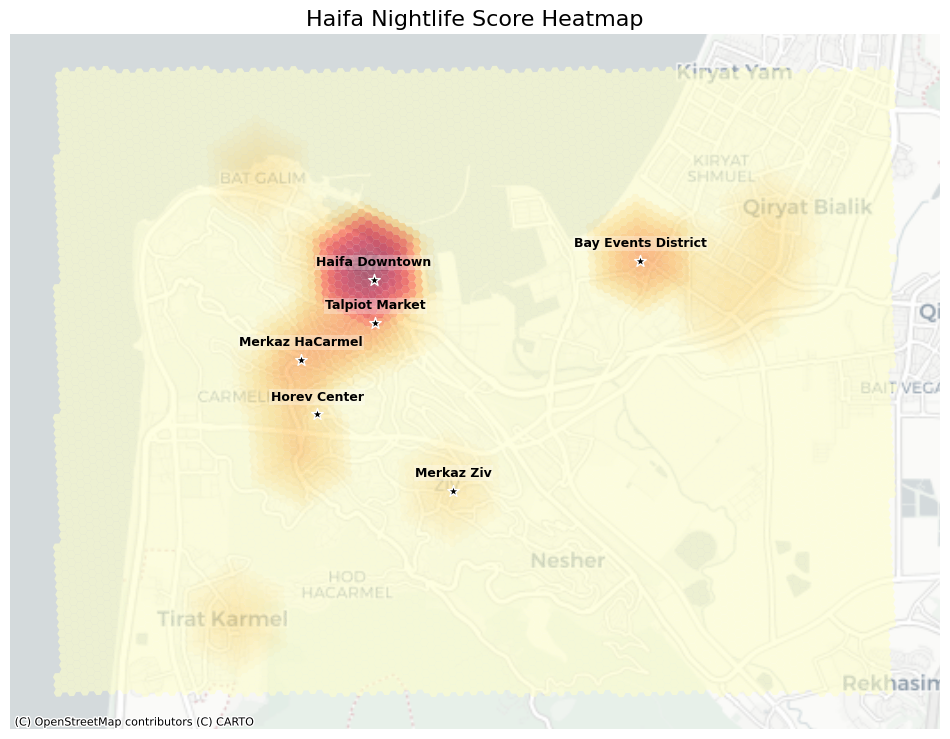

In [0]:
# Configuration
MIN_LAT, MAX_LAT = 32.75, 32.85
MIN_LON, MAX_LON = 34.94, 35.10
TARGET_COLUMN = "nightlife_score"
SPECIFIC_LOCATIONS = {
    "Haifa Downtown":      (32.8165, 35.0005),
    "Talpiot Market":      (32.8095, 35.0008),
    "Merkaz Ziv":          (32.7823, 35.0159),
    "Horev Center":        (32.7947, 34.9896),
    "Merkaz HaCarmel":     (32.8035, 34.9865),
    "Bay Events District": (32.8196, 35.0520)  
}

# Fetch data
haifa_df = spark.table(WORLD_DATA_OUTPUT_TABLE) \
    .filter((col("latitude").between(MIN_LAT, MAX_LAT)) & 
            (col("longitude").between(MIN_LON, MAX_LON))) \
    .select("h3_index", TARGET_COLUMN) \
    .toPandas()

# Generate grid
lat_steps = np.arange(MIN_LAT, MAX_LAT, 0.001)
lon_steps = np.arange(MIN_LON, MAX_LON, 0.001)
lat_grid, lon_grid = np.meshgrid(lat_steps, lon_steps)
found_hexes = set()
for lat, lon in zip(lat_grid.flatten(), lon_grid.flatten()):
    hex_id = h3.latlng_to_cell(lat, lon, RESOLUTION)
    found_hexes.add(hex_id)
full_grid_df = pd.DataFrame(list(found_hexes), columns=['h3_index'])

# Merge data
merged_df = pd.merge(full_grid_df, haifa_df, on='h3_index', how='left')
merged_df[TARGET_COLUMN] = merged_df[TARGET_COLUMN].fillna(0)


# Normalization
merged_df['log_score'] = merged_df[TARGET_COLUMN].apply(np.log1p)
min_val = merged_df['log_score'].min()
max_val = merged_df['log_score'].max()
merged_df['norm_score'] = (merged_df['log_score'] - min_val) / (max_val - min_val)

# Geometry generation
def h3_to_polygon(h3_idx):
    points = h3.cell_to_boundary(h3_idx)
    swapped_points = [(p[1], p[0]) for p in points]
    return Polygon(swapped_points)
merged_df['geometry'] = merged_df['h3_index'].apply(h3_to_polygon)

# Create GeoDataFrame
gdf = gpd.GeoDataFrame(merged_df, geometry='geometry')
gdf.crs = "EPSG:4326" 
gdf = gdf.to_crs(epsg=3857)

# Visualization
fig, ax = plt.subplots(figsize=(12, 10))
gdf.plot(
    column='norm_score',  
    cmap='YlOrRd',
    alpha=0.6,
    ax=ax
)
cx.add_basemap(ax, crs=gdf.crs, source=cx.providers.CartoDB.Positron)
landmark_names, landmark_points = zip(*[(name, Point(lon, lat)) for name, (lat, lon) in SPECIFIC_LOCATIONS.items()])
landmark_names, landmark_points = list(landmark_names), list(landmark_points)
landmarks_gdf = gpd.GeoDataFrame({'name': landmark_names, 'geometry': landmark_points}, crs="EPSG:4326").to_crs(epsg=3857)
landmarks_gdf.plot(ax=ax, color='black', markersize=75, marker='*', edgecolor='white')
for x, y, label in zip(landmarks_gdf.geometry.x, landmarks_gdf.geometry.y, landmarks_gdf.name):
    ax.text(x, y + 300, label, fontsize=9, ha='center', fontweight='bold', color='black', 
            bbox=dict(facecolor='white', alpha=0.3, edgecolor='none', pad=1))
ax.set_title('Haifa Nightlife Score Heatmap', fontsize=16)
ax.set_axis_off() 

plt.show()

### Israel Spacial Heatmap

In [0]:
# Configuration
MIN_LAT, MAX_LAT = 29.40, 33.50
MIN_LON, MAX_LON = 34.20, 35.95
TARGET_COLUMN = "nightlife_score"

# Fetch data
df_israel = spark.table(WORLD_DATA_OUTPUT_TABLE) \
    .filter((col("latitude").between(MIN_LAT, MAX_LAT)) & 
            (col("longitude").between(MIN_LON, MAX_LON))) \
    .select("h3_index", TARGET_COLUMN) \
    .toPandas()

# Logarithmic normalization
df_israel['log_score'] = np.log1p(df_israel[TARGET_COLUMN])
min_log = df_israel['log_score'].min()
max_log = df_israel['log_score'].max()
denom = (max_log - min_log) if (max_log - min_log) > 0 else 1
df_israel['norm_score'] = (df_israel['log_score'] - min_log) / denom

# Visualization Setup
m = folium.Map(location=[31.4, 35.0], zoom_start=8, tiles="CartoDB positron")
cmap = cm.YlOrRd

# Render Data Hexagons
for _, row in df_israel.iterrows():
    hex_id = row['h3_index']
    norm_val = row['norm_score']
    real_score = row[TARGET_COLUMN]
    
    # Get geometry
    points = h3.cell_to_boundary(hex_id)
    
    # Calculate visual properties
    color_hex = colors.to_hex(cmap(norm_val)[:3])
    opacity = 0.3 if real_score == 0 else 0.6
    weight = 0 if real_score == 0 else 1

    folium.Polygon(
        locations=points,
        fill=True,
        fill_color=color_hex,
        color=color_hex,
        weight=weight,
        fill_opacity=opacity, 
        tooltip=f"Score: {real_score:.1f}"
    ).add_to(m)

# Save & display
# Uncomment the following lines to save the map:

# dbutils.fs.mkdirs("dbfs:/FileStore/maps")
# m.save("/dbfs/FileStore/maps/israel_nightlife_map.html")
# displayHTML("""
# <iframe 
#   src="/files/maps/israel_nightlife_map.html"
#   width="100%" 
#   height="900"
#   style="border:none;">
# </iframe>
# """)